# 0. Install and Import Dependencies

In [3]:
import cv2
import mediapipe as mp
import numpy as np
mp_drawing = mp.solutions.drawing_utils
mp_pose = mp.solutions.pose
import os
import csv
print(cv2.__version__)
import pandas as pd
print(pd.__version__)
import glob
import matplotlib.pyplot as plt
import scipy.stats
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors

from tslearn.utils import to_time_series_dataset
from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.clustering import TimeSeriesKMeans
from tslearn.metrics import dtw
from scipy.stats import skew, kurtosis


4.10.0
2.2.2


OMP_NUM_THREADS is set to: 3
Cluster 0:
Fast-UmeshYadav.csv: Pearson r = 0.25
Novice1_1.csv: Pearson r = 0.37
Novice1_2.csv: Pearson r = 0.73
Novice1_3.csv: Pearson r = 0.50
Novice1_4.csv: Pearson r = 0.68
Novice1_5.csv: Pearson r = 0.74
Novice1_6.csv: Pearson r = 0.65
Cluster 1:
Fast-ChrisWoakes.csv: Pearson r = 0.40
Fast-IshantSharma.csv: Pearson r = 0.43
Fast-JaspritBumrah.csv: Pearson r = 0.68
Fast-JofraArcher.csv: Pearson r = -0.16
Fast-SeanAbbott.csv: Pearson r = 0.51
Fast-TrentBoult.csv: Pearson r = 0.94
FastMedium-MohammedShami.csv: Pearson r = 0.05
Nalin1.csv: Pearson r = 0.45
Nalin2.csv: Pearson r = 0.50
Nalin3.csv: Pearson r = 0.34
Nalin4.csv: Pearson r = 0.50
Nalin5.csv: Pearson r = 0.61
Nalin6.csv: Pearson r = 0.56
Novice3_1.csv: Pearson r = -0.11
Novice3_2.csv: Pearson r = 0.29
Cluster 2:
Fast-AnrichNortje.csv: Pearson r = -0.14
Fast-ArshdeepSingh.csv: Pearson r = -0.96
Fast-BhuvneshwarKumar.csv: Pearson r = 0.19
Fast-DaleSteyn.csv: Pearson r = -0.14
Fast-JoshHazlewood.cs

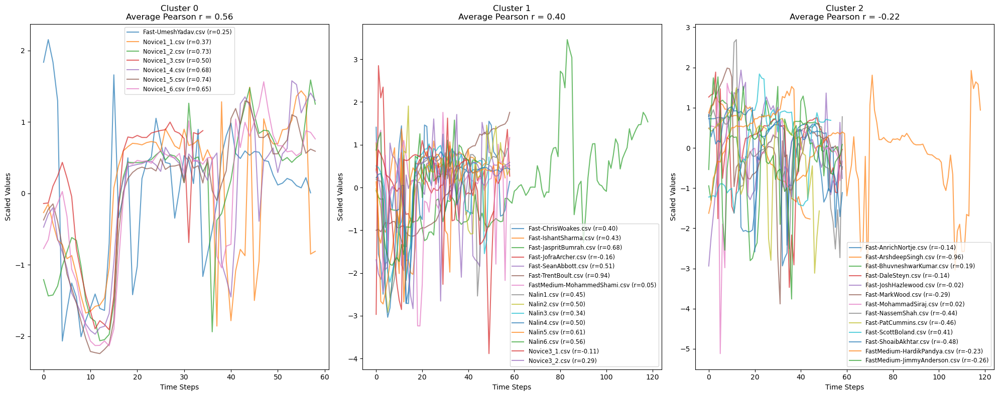

In [4]:
# Set the environment variable to control the number of threads used by OpenMP
os.environ["OMP_NUM_THREADS"] = "3"
print(f"OMP_NUM_THREADS is set to: {os.environ['OMP_NUM_THREADS']}")

# Define the path to fetch all CSV files
files = glob.glob('path to the folder where to fetch all csv files')

# Initialize lists to store time-series data and corresponding file labels
time_series_data = []
file_labels = []

# Loop through each file to process and extract relevant data
for file in files:
    file_name = os.path.basename(file)  # Extract file name from the file path
    df = pd.read_csv(file)  # Read the CSV file into a DataFrame

    # Filter rows where frame_time is between -1 and 1 seconds
    filtered_data = df[(df['frame_time'] > -1) & (df['frame_time'] < 1)]

    # Extract relevant columns as NumPy arrays
    time_stamps = filtered_data['frame_time'].to_numpy()
    right_arm_angle = filtered_data['right_arm_angle'].to_numpy()
    right_leg_angle = filtered_data['right_leg_angle'].to_numpy()
    left_arm_angle = filtered_data['left_arm_angle'].to_numpy()
    left_leg_angle = filtered_data['left_leg_angle'].to_numpy()
    left_foot_angle = filtered_data['left_foot_angle'].to_numpy()
    right_foot_angle = filtered_data['right_foot_angle'].to_numpy()
    right_wrist_angle = filtered_data['right_wrist_angle'].to_numpy()
    left_wrist_angle = filtered_data['left_wrist_angle'].to_numpy()
    right_wrist_speed = filtered_data['Speed'].to_numpy()

    # Compute the rate of change (gradient) for selected angles
    roc_right_arm = np.gradient(right_arm_angle, time_stamps)
    roc_right_leg = np.gradient(right_leg_angle, time_stamps)
    roc_left_arm = np.gradient(left_arm_angle, time_stamps)
    roc_left_leg = np.gradient(left_leg_angle, time_stamps)
    roc_right_wrist = np.gradient(right_wrist_angle, time_stamps)
    roc_left_wrist = np.gradient(left_wrist_angle, time_stamps)

    # Combine angles and rates of change as a multi-dimensional time series
    time_series = np.vstack([
        right_arm_angle, roc_right_arm,
        right_leg_angle, roc_right_leg,
        left_arm_angle, roc_left_arm,
        left_leg_angle, roc_left_leg,
        right_wrist_angle, roc_right_wrist,
        left_wrist_angle, roc_left_wrist,
        left_foot_angle, right_foot_angle,
        right_wrist_speed
    ]).T  # Transpose to make time steps the first axis

    time_series_data.append(time_series)  # Add the time series to the dataset
    file_labels.append(file_name)  # Store the corresponding file name

# Convert the list of time-series arrays into a time-series dataset
time_series_dataset = to_time_series_dataset(time_series_data)

# Standardize the time-series data using z-score normalization
scaler = TimeSeriesScalerMeanVariance()
time_series_dataset_scaled = scaler.fit_transform(time_series_dataset)

# Apply KMeans clustering with Dynamic Time Warping (DTW) as the metric
num_clusters = 3
model = TimeSeriesKMeans(n_clusters=num_clusters, metric="dtw", random_state=42)
cluster_labels = model.fit_predict(time_series_dataset_scaled)

# Visualize the clustering results
plt.figure(figsize=(20, 8))

for cluster in range(num_clusters):
    # Identify files and time series in the current cluster
    cluster_files = [file_labels[i] for i, label in enumerate(cluster_labels) if label == cluster]
    cluster_time_series = [time_series_dataset_scaled[i] for i, label in enumerate(cluster_labels) if label == cluster]

    pearson_values = []  # Store Pearson correlation values for the cluster

    plt.subplot(1, num_clusters, cluster + 1)

    for i, series in enumerate(cluster_time_series):
        # Extract the right arm angle series as an example
        right_arm_angle_series = series[:, 0]  # Column index 0 corresponds to right_arm_angle
        time_steps = np.arange(len(right_arm_angle_series))

        # Clean the data by removing NaN or infinite values
        valid_indices = np.isfinite(right_arm_angle_series) & np.isfinite(time_steps)
        cleaned_time_steps = time_steps[valid_indices]
        cleaned_right_arm_angle_series = right_arm_angle_series[valid_indices]

        # Compute Pearson correlation with respect to time
        if len(cleaned_time_steps) > 1:  # Ensure at least two data points for correlation
            pearson_corr, _ = scipy.stats.pearsonr(cleaned_time_steps, cleaned_right_arm_angle_series)
        else:
            pearson_corr = np.nan  # Assign NaN if not enough data points

        pearson_values.append(pearson_corr)  # Store the computed Pearson correlation

        # Plot the right arm angle series
        plt.plot(right_arm_angle_series, label=f"{cluster_files[i]} (r={pearson_corr:.2f})", alpha=0.7)

    # Calculate the average Pearson correlation for the cluster
    avg_pearson_corr = np.nanmean(pearson_values)  # Ignore NaN values during the mean computation

    plt.title(f"Cluster {cluster}\nAverage Pearson r = {avg_pearson_corr:.2f}")
    plt.xlabel("Time Steps")
    plt.ylabel("Scaled Values")
    plt.legend(fontsize="small")

    # Print Pearson correlation coefficients for the cluster
    print(f"Cluster {cluster}:")
    for file, r_value in zip(cluster_files, pearson_values):
        print(f"{file}: Pearson r = {r_value:.2f}")

plt.tight_layout()
plt.savefig('time_series_clustering_dtw_with_pearson.png')  # Save the plot
# plt.show()  # Uncomment to display the plot interactively

# Print the file labels and their respective clusters
for file, cluster in zip(file_labels, cluster_labels):
    print(f"{file}: Cluster {cluster}")

OMP_NUM_THREADS is set to: 3

Feature: right_arm_angle
Fast-AnrichNortje.csv: Cluster 2
Fast-ArshdeepSingh.csv: Cluster 1
Fast-BhuvneshwarKumar.csv: Cluster 2
Fast-ChrisWoakes.csv: Cluster 2
Fast-DaleSteyn.csv: Cluster 2
Fast-IshantSharma.csv: Cluster 0
Fast-JaspritBumrah.csv: Cluster 0
Fast-JofraArcher.csv: Cluster 2
Fast-JoshHazlewood.csv: Cluster 0
Fast-MarkWood.csv: Cluster 1
Fast-MohammadSiraj.csv: Cluster 1
Fast-NassemShah.csv: Cluster 1
Fast-PatCummins.csv: Cluster 1
Fast-ScottBoland.csv: Cluster 0
Fast-SeanAbbott.csv: Cluster 0
Fast-ShoaibAkhtar.csv: Cluster 1
Fast-TrentBoult.csv: Cluster 0
Fast-UmeshYadav.csv: Cluster 2
FastMedium-HardikPandya.csv: Cluster 1
FastMedium-JimmyAnderson.csv: Cluster 2
FastMedium-MohammedShami.csv: Cluster 2
Nalin1.csv: Cluster 2
Nalin2.csv: Cluster 0
Nalin3.csv: Cluster 2
Nalin4.csv: Cluster 2
Nalin5.csv: Cluster 2
Nalin6.csv: Cluster 0
Novice1_1.csv: Cluster 0
Novice1_2.csv: Cluster 0
Novice1_3.csv: Cluster 0
Novice1_4.csv: Cluster 0
Novice1_5.cs

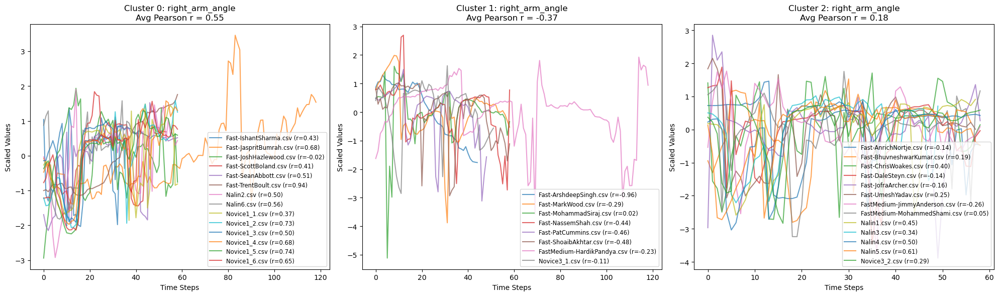

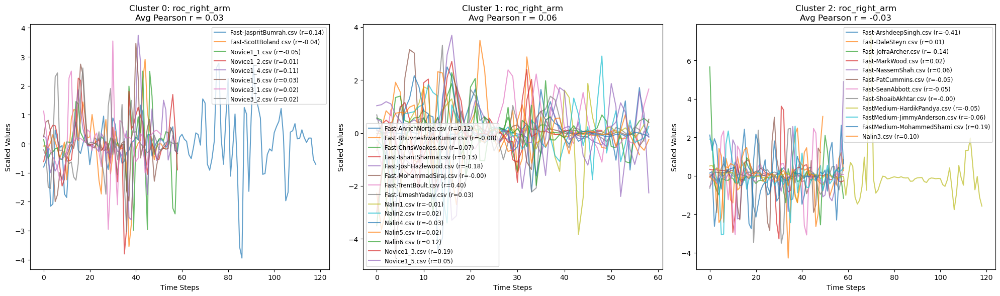

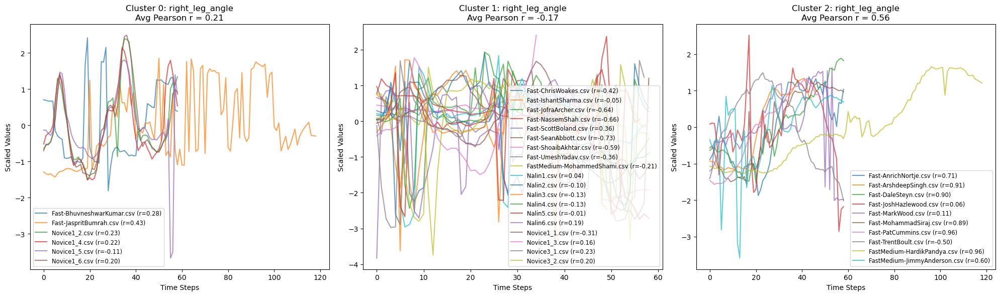

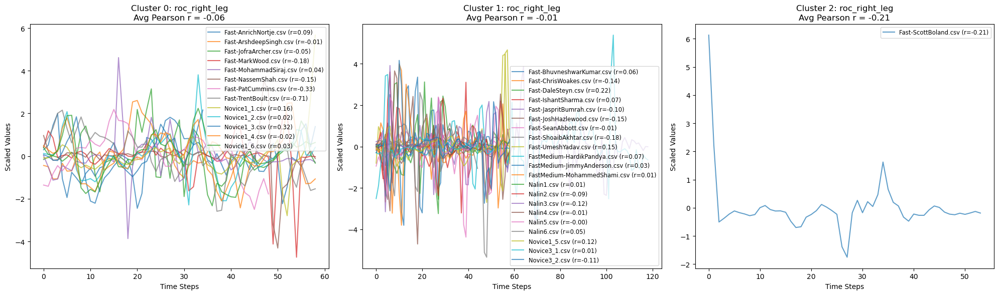

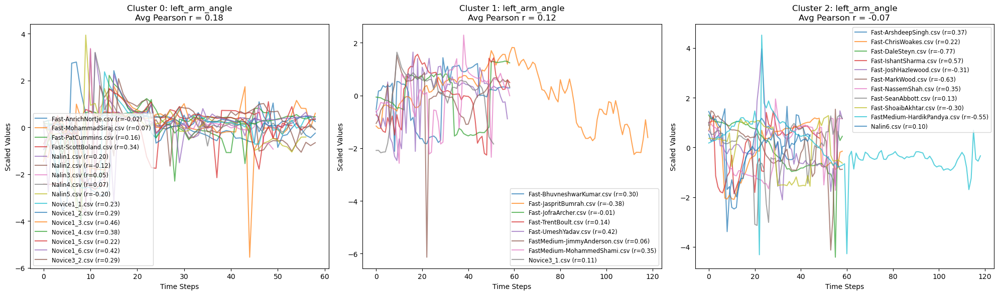

...

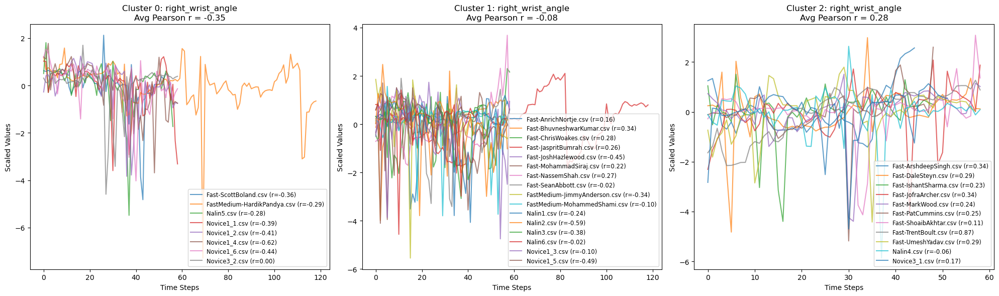

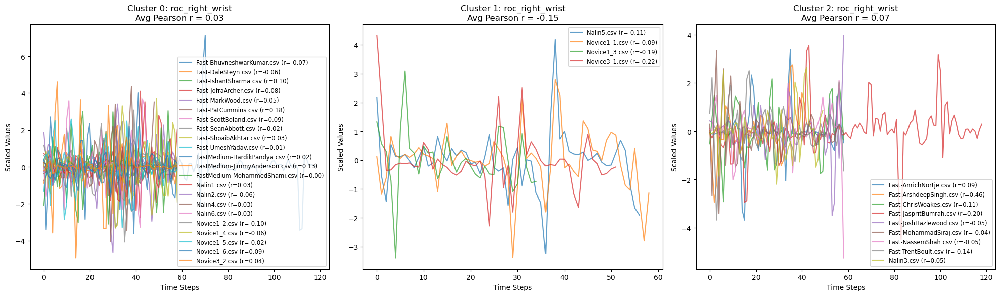

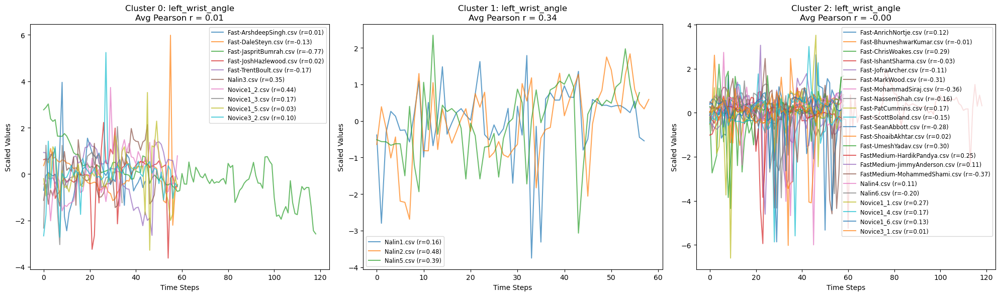

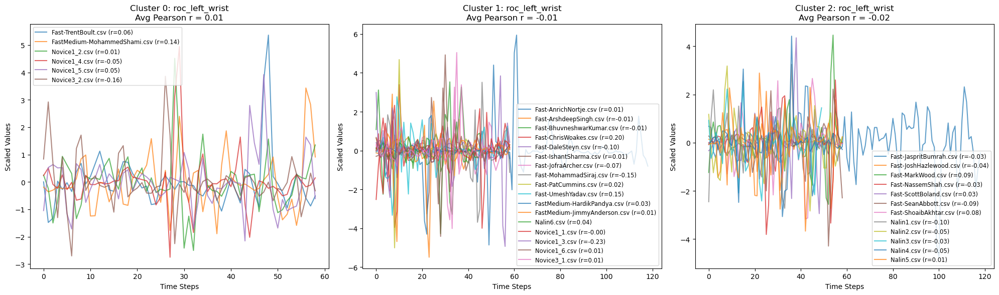

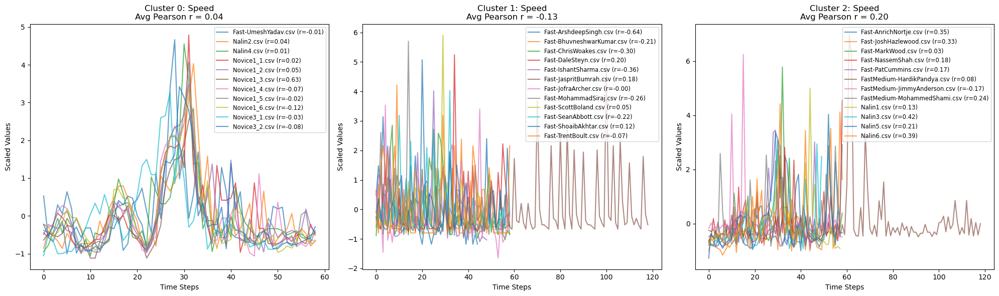

In [5]:
# Set the number of threads for parallel processing
os.environ["OMP_NUM_THREADS"] = "3"
print(f"OMP_NUM_THREADS is set to: {os.environ['OMP_NUM_THREADS']}")

# Fetch all CSV files from the specified directory
files = glob.glob('path to the folder where to fetch all csv files')

# Prepare a dictionary to store time-series data for various features
time_series_data = {
    "right_arm_angle": [],
    "roc_right_arm": [],
    "right_leg_angle": [],
    "roc_right_leg": [],
    "left_arm_angle": [],
    "roc_left_arm": [],
    "left_leg_angle": [],
    "roc_left_leg": [],
    "left_foot_angle": [],
    "roc_left_foot": [],
    "right_foot_angle": [],
    "roc_right_foot": [],
    "right_wrist_angle": [],
    "roc_right_wrist": [],
    "left_wrist_angle": [],
    "roc_left_wrist": [],
    "Speed": []
}

# Store file labels for reference during clustering and visualization
file_labels = []

# Load and process each CSV file
for file in files:
    file_name = os.path.basename(file)  # Get the file name
    df = pd.read_csv(file)  # Load the CSV file into a DataFrame

    # Filter rows where frame_time is between -1 and 1 seconds
    filtered_data = df[(df['frame_time'] > -1) & (df['frame_time'] < 1)]
    time_stamps = filtered_data['frame_time'].to_numpy()  # Extract time stamps

    # Skip files with insufficient or no data
    if filtered_data.empty or len(time_stamps) < 2:
        print(f"Skipping file '{file_name}' due to insufficient or no data.")
        continue

    # Extract angles and calculate rates of change (ROC) for each feature
    try:
        # Extract individual feature columns
        right_arm_angle = filtered_data['right_arm_angle'].to_numpy()
        right_leg_angle = filtered_data['right_leg_angle'].to_numpy()
        left_arm_angle = filtered_data['left_arm_angle'].to_numpy()
        left_leg_angle = filtered_data['left_leg_angle'].to_numpy()
        left_foot_angle = filtered_data['left_foot_angle'].to_numpy()
        right_foot_angle = filtered_data['right_foot_angle'].to_numpy()
        right_wrist_angle = filtered_data['right_wrist_angle'].to_numpy()
        left_wrist_angle = filtered_data['left_wrist_angle'].to_numpy()
        right_wrist_speed = filtered_data['Speed'].to_numpy()

        # Calculate rate of change for each feature
        roc_right_arm = np.gradient(right_arm_angle, time_stamps)
        roc_right_leg = np.gradient(right_leg_angle, time_stamps)
        roc_left_arm = np.gradient(left_arm_angle, time_stamps)
        roc_left_leg = np.gradient(left_leg_angle, time_stamps)
        roc_left_foot = np.gradient(left_foot_angle, time_stamps)
        roc_right_foot = np.gradient(right_foot_angle, time_stamps)
        roc_right_wrist = np.gradient(right_wrist_angle, time_stamps)
        roc_left_wrist = np.gradient(left_wrist_angle, time_stamps)
    except KeyError as e:
        # Handle missing columns gracefully
        print(f"Missing column in file '{file_name}': {e}")
        continue

    # Append extracted data to the respective lists in the dictionary
    time_series_data["right_arm_angle"].append(right_arm_angle)
    time_series_data["roc_right_arm"].append(roc_right_arm)
    time_series_data["right_leg_angle"].append(right_leg_angle)
    time_series_data["roc_right_leg"].append(roc_right_leg)
    time_series_data["left_arm_angle"].append(left_arm_angle)
    time_series_data["roc_left_arm"].append(roc_left_arm)
    time_series_data["left_leg_angle"].append(left_leg_angle)
    time_series_data["roc_left_leg"].append(roc_left_leg)
    time_series_data["left_foot_angle"].append(left_foot_angle)
    time_series_data["roc_left_foot"].append(roc_left_foot)
    time_series_data["right_foot_angle"].append(right_foot_angle)
    time_series_data["roc_right_foot"].append(roc_right_foot)
    time_series_data["right_wrist_angle"].append(right_wrist_angle)
    time_series_data["roc_right_wrist"].append(roc_right_wrist)
    time_series_data["left_wrist_angle"].append(left_wrist_angle)
    time_series_data["roc_left_wrist"].append(roc_left_wrist)
    time_series_data["Speed"].append(right_wrist_speed)

    file_labels.append(file_name)

# Perform clustering for each feature
cluster_results = {}
num_clusters = 3  # Define the number of clusters

for feature, data in time_series_data.items():
    # Remove invalid/insufficient time-series data
    data = [series for series in data if len(series) > 1 and not np.any(np.isnan(series))]
    if len(data) == 0:
        print(f"Skipping feature '{feature}' as it has no valid time series.")
        continue

    # Convert the data to a time-series dataset and standardize it
    ts_dataset = to_time_series_dataset(data)
    if ts_dataset.shape[0] < 2:  # Ensure at least two time-series for clustering
        print(f"Not enough time series for clustering in feature '{feature}'.")
        continue

    scaler = TimeSeriesScalerMeanVariance()
    try:
        ts_dataset_scaled = scaler.fit_transform(ts_dataset)
    except ValueError as e:
        print(f"Error scaling feature '{feature}': {e}")
        continue

    # Apply KMeans clustering with DTW metric
    try:
        model = TimeSeriesKMeans(n_clusters=num_clusters, metric="dtw", random_state=42)
        cluster_labels = model.fit_predict(ts_dataset_scaled)
        cluster_results[feature] = cluster_labels
    except ValueError as e:
        print(f"Error clustering feature '{feature}': {e}")
        continue

    # Visualize clustering results
    plt.figure(figsize=(20, 6))
    for cluster in range(num_clusters):
        plt.subplot(1, num_clusters, cluster + 1)
        pearson_values = []
        for i, label in enumerate(cluster_labels):
            if label == cluster:
                time_series = ts_dataset_scaled[i].flatten()
                valid_indices = np.isfinite(time_series)
                time_steps = np.arange(len(time_series))[valid_indices]
                cleaned_series = time_series[valid_indices]
                if len(cleaned_series) > 1:
                    pearson_corr, _ = scipy.stats.pearsonr(time_steps, cleaned_series)
                else:
                    pearson_corr = np.nan
                pearson_values.append(pearson_corr)
                plt.plot(time_series, label=f"{file_labels[i]} (r={pearson_corr:.2f})", alpha=0.7)
        avg_pearson_corr = np.nanmean(pearson_values)
        plt.title(f"Cluster {cluster}: {feature}\nAvg Pearson r = {avg_pearson_corr:.2f}")
        plt.xlabel("Time Steps")
        plt.ylabel("Scaled Values")
        plt.legend(fontsize="small")
    plt.tight_layout()
    plt.savefig(f"time_series_clustering_{feature}_with_pearson.png")

# Print cluster results for each feature
for feature, labels in cluster_results.items():
    print(f"\nFeature: {feature}")
    for file, cluster in zip(file_labels, labels):
        print(f"{file}: Cluster {cluster}")